# Autorzy

- Mateusz Łopaciński
- Mateusz Mazur

# Preprocessing danych

## Wczytanie obrazów oraz konwersja do wektorów

In [2]:
DATA_DIR_PATH = 'data'

In [6]:
import os
from PIL import Image, ImageOps
import numpy as np

# 1. Paths to directories with images
paths = ['tomato_bacterial/', 'tomato_blight/', 'tomato_septoria/']
# Labels for images indicating the type of disease
labels = ['Tomato Bacterial', 'Tomato Blight', 'Tomato Septoria']

vectors = []

for directory_path in paths:
  for filename in os.listdir(f'{DATA_DIR_PATH}/{directory_path}'):
    if not (filename.endswith('.jpg') or filename.endswith('.png')):
      continue
    # 2. Read images to the memory
    img_path = os.path.join(DATA_DIR_PATH, directory_path, filename)
    img = Image.open(img_path)
    # 3. Resize images to 224x224
    img = img.resize((224, 224))
    # 4. Convert images to grayscale
    img = ImageOps.grayscale(img)
    # 5. Convert images (2-dimensional matrices) to vectors
    img_arr = np.array(img)
    vector = img_arr.reshape(-1)
    vectors.append(vector)

images = np.array(vectors)

## Centrowanie zbioru

Od każdego obrazu ze zbioru odejmujemy średni obraz

In [7]:
avg_image = np.mean(images, axis=0).astype(np.uint8)
processed_images = images - avg_image

# std_dev = images_centred.std()
# processed_images /= std_dev

Niekiedy zalecane też jest dzielenie przez odchylenie standardowe. Zazwyczaj warto je wykonać, gdy wartości pikseli mają duży zakres lub gdy celem jest zwiększenie stabilności numerycznej uczenia. Jednakże w niektórych przypadkach (np. w przypadku obrazów binarnych) nie jest to konieczne lub nawet niepożądane.

Po podzieleniu zbioru wycentrowanych obrazów przez odchylenie standardowe, przeprowadziliśmy późniejszą analizę i otrzymane wyniki nie były satysfakcjonujące. Z tego powodu, zdecydowaliśmy się jedynie na centrowanie zbioru bez dzielenia przez odchylenie standardowe.

# Analiza głównych składowych

## Transformacja PCA

Algorytm PCA służy do redukcji wymiarowości danych poprzez przekształcenie oryginalnych cech na niewspółliniowe kombinacje liniowe, zwane składowymi głównymi. W celu dokonania takiej transformacji, konieczne jest wskazanie liczby składowych głównych, na które ma zostać dokonana transformacja.

Zaczniemy więc od wyznaczenia optymalnej liczby składowych głównych. Wykorzystamy do tego metodę, polegającą na wyznaczeniu progu wariancji, powyżej którego składowe główne są brane pod uwagę. Próg ten jest określany jako minimalna wartość wariancji, która musi być zachowana przez każdą kolejną składową główną. Najczęściej stosuje się próg około 80-90% wyjaśnionej wariancji.

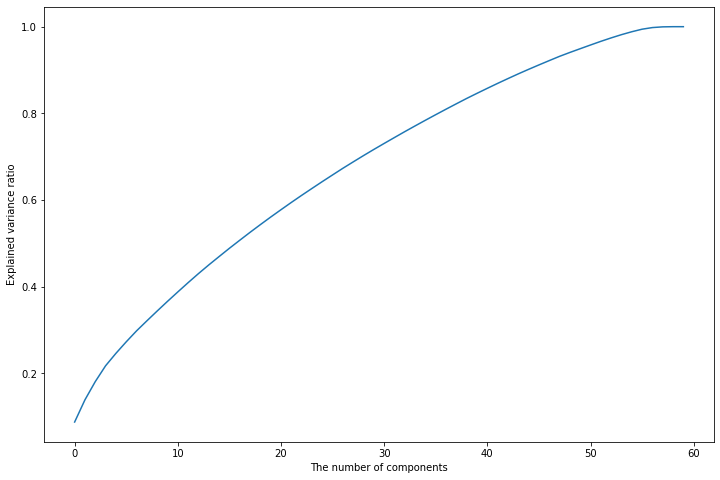

Best number of components: 51


In [8]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

pca = PCA().fit(processed_images)

# Analyze the cumulative variance curve
plt.figure(figsize=(12, 8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('The number of components')
plt.ylabel('Explained variance ratio')
plt.show()

# Choose the number of components that explain at least 95% of the variance
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance_ratio >= 0.95) + 1
print("Best number of components:", n_components)

Otrzymaliśmy optymalną liczbę składowych, wynoszącą `51`. Do wykonania transformacji PCA, wykorzystamy funkcję z biblioteki `sklearn`. Poniżej znajduje się implementacja uwzględnieniem wyznaczonej optymalnej liczby składowych głównych,

In [5]:
pca = PCA(n_components=51)

images_pca = pca.fit_transform(processed_images)

print("Transformed shape: ", images_pca.shape)

Transformed shape:  (60, 51)


## Macierz kowariancji

Poniższe fragmenty macierzy danych pozwalają zaobserwować, że, po wykonaniu transformacji PCA:
- elementy poza przekątną główną są bliskie zeru, co oznacza, że składowe główne są nieskorelowane,
-  wartości na przekątnej głównej są uporządkowane malejąco, co oznacza, że pierwsze składowe główne mają większą wariancję niż kolejne. To z kolei oznacza, że pierwsze składowe główne są bardziej znaczące niż kolejne i mają większy wpływ na strukturę danych.

### Przed wykonaniem transformacji PCA

In [36]:
cov_matrix = np.cov(processed_images, rowvar=False)
cov_matrix

array([[7799.75677966, 5642.56694915, 4471.99067797, ..., -297.39745763,
        -374.84661017,  377.20847458],
       [5642.56694915, 7691.74322034, 4935.08220339, ..., -439.65847458,
        -315.73474576,  436.4559322 ],
       [4471.99067797, 4935.08220339, 7351.13305085, ..., -397.08220339,
         -60.44661017,  687.50677966],
       ...,
       [-297.39745763, -439.65847458, -397.08220339, ..., 6856.59067797,
        4109.19237288, 4545.05254237],
       [-374.84661017, -315.73474576,  -60.44661017, ..., 4109.19237288,
        6243.08785311, 4231.34632768],
       [ 377.20847458,  436.4559322 ,  687.50677966, ..., 4545.05254237,
        4231.34632768, 6720.91412429]])

### Po wykonaniu transformacji PCA

In [8]:
cov_matrix_pca = np.cov(images_pca, rowvar=False)
cov_matrix_pca

array([[ 3.41878512e+07, -7.36406917e-10, -7.65958641e-09, ...,
        -1.63660649e-09,  5.18861337e-10,  4.70541962e-10],
       [-7.36406917e-10,  2.00483343e+07,  7.01207066e-09, ...,
        -1.66676891e-09, -4.37575971e-10, -4.88078899e-10],
       [-7.65958641e-09,  7.01207066e-09,  1.64488953e+07, ...,
         1.26834200e-09,  1.28009342e-09,  9.12565652e-10],
       ...,
       [-1.63660649e-09, -1.66676891e-09,  1.26834200e-09, ...,
         3.50916395e+06, -4.48550031e-10, -6.44052737e-10],
       [ 5.18861337e-10, -4.37575971e-10,  1.28009342e-09, ...,
        -4.48550031e-10,  3.37342730e+06, -1.30078676e-09],
       [ 4.70541962e-10, -4.88078899e-10,  9.12565652e-10, ...,
        -6.44052737e-10, -1.30078676e-09,  3.35318283e+06]])

## Średnie zdjęcie

Poniższa ilustracja prezentuje, jak wyglądało średnie zdjęcie, które odjęliśmy wcześniej od pozostałych zdjęć, podczas wykonywania centralizacji zbioru obrazów.

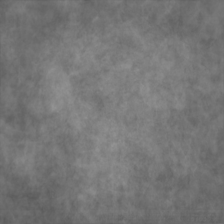

In [9]:
pil_img = Image.fromarray(np.uint8(avg_image.reshape(224, 224)))
display(pil_img)

## Nowe wektory bazowe (principal axes)

Poniższy kod służy do wyznaczenia wektorów bazowych oraz wizualizacji tych wektorów w postaci obrazów.

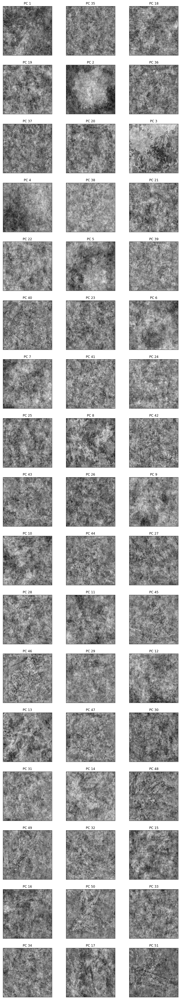

In [10]:
import matplotlib.pyplot as plt

# Get the new basis vectors
new_axes = pca.components_

# Sort the new basis vectors by the variance they explain
variances = pca.explained_variance_
sorted_indices = np.argsort(variances)[::-1]
new_axes_sorted = new_axes[sorted_indices]

# Visualize the new basis vectors
scale = 4
fig, axes = plt.subplots(17, 3, figsize=(3 * scale, 17 * scale))

for i, axis in enumerate(new_axes_sorted):
    img = axis.reshape(224, 224)
    ax = axes[i % 17][i % 3]
    ax.imshow(img, cmap='gray')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'PC {i+1}')
plt.show()


## Redukcja wymiarowości

Poniższa funkcja pomocnicza służy do redukcji wymiarów do wskazanej liczby składowych głównych.

In [11]:
def reduce_images(n_components):
  pca = PCA(n_components=n_components)
  images_pca = pca.fit_transform(processed_images)
  
  for i in range(len(processed_images)):
      image_pca = images_pca[i]
      image_pca[n_components:] = 0
      images_pca[i] = image_pca
      
  images_reconstructed = pca.inverse_transform(images_pca).reshape((len(images), 224, 224)) + avg_image.reshape((224, 224))
  
  return images_reconstructed

Tę funkcję wykorzystujemy w poniższym fragmencie kodu do redukcji wymiarowości obserwacji do 3, 9, 27 oraz 51 składowych.

Otrzymane w ten sposób obrazy znajdują się poniżej. Pojedynczy wiersz odpowiada pojedynczemu obrazowi, a kolejne kolumny wiersza, redukcji odpowiednio do 3, 9, 27 oraz 51 wymiarów.

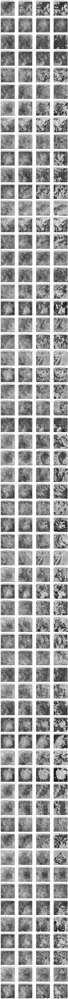

In [14]:
components = (3, 9, 27, 51)
reduced_images = [reduce_images(n) for n in components]

scale = 4
fig, axes = plt.subplots(
  len(processed_images), 
  len(components), 
  figsize=(len(components) * scale, len(processed_images) * scale)
)

for i, (n, images) in enumerate(zip(components, reduced_images)):
  for j, image in enumerate(images):
    img = image.reshape(224, 224)
    ax = axes[j][i]
    ax.imshow(img, cmap='gray')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{labels[j // 20]} (PCA {n}): {j % 20 + 1}')
plt.show()

Obserwując powyższe ilustracje, możemy zauważyć, że zwiększanie liczby wymiarów, skutkuje uzyskaniem dokładniejszych obrazów. Nie jest to zaskakujące, ponieważ zwiększenie liczby wymiarów powoduje, że zachowujemy więcej informacji o oryginalnym obrazie.

Możemy również zaobserwować, że w wielu przypadkach redukcja do 27 wymiarów jest niewystarczająca i zwiększenie liczby głównych składowych do 51 znacząco poprawia dokładność otrzymanych ilustracji.

## Rzutowanie PCA na płaszczyznę

Rzutowanie na płaszczyznę polega na redukcji wymiarowości do 2 wymiarów (2 najważniejszych głównych składowych), a następnie, umieszczeniu tych 2-wymiarowych wektorów danych jako punkty na wykresie.

Ponieważ wcześniejsze główne składowe mają większe znaczenie niż składowe, które znajdują się na dalszych pozycjach, redukcja do 2 wymiarów, pozwala na wizualizację najważniejszych cech zbioru.

Dzięki rzutowaniu na płaszczyznę, można w łatwy sposób zaobserwować zależności między zmiennymi oraz, czy dane mają określoną strukturę (lub są chaotycznie rozproszone).

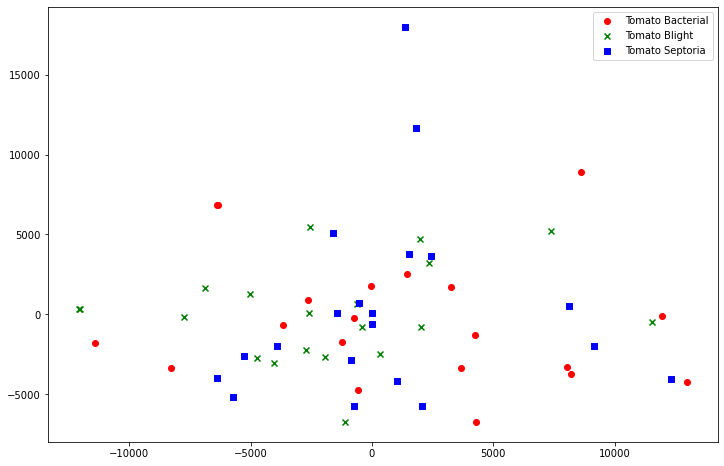

In [13]:
pca = PCA(n_components=2)
projected = pca.fit_transform(processed_images)

shortened = projected[:, :2]

colors = ['red', 'green', 'blue']
markers = ['o', 'x', 's']
plt.figure(figsize=(12, 8))

for i, (label, color, marker) in enumerate(zip(labels, colors, markers)):
  points = shortened[i * 20: (i + 1) * 20]
  plt.scatter(points[:, 0], points[:, 1], c=color, marker=marker, label=label)

plt.legend()
plt.show()

W przypadku analizowanych danych widzimy, że dane nie są za bardzo uporządkowane.

## Wykres wariancji wyjaśnionej

Wykres wariancji wyjaśnionej może służyć m.in. do wyboru optymalnej liczby głównych składowych, które zachowują najwięcej danych z oryginalnego zbioru. W ten sposób dokonaliśmy wyboru odpowiedniej liczby głównych składowych podczas dokonywania powyższej analizy.

Taki wykres powinien być krzywą wklęsłą, zaczynającą się w punkcie $(0, 0)$ i zmierzającą do $1$ wraz ze wzrostem liczby składowych głównych.

### Dla 2 składowych głównych

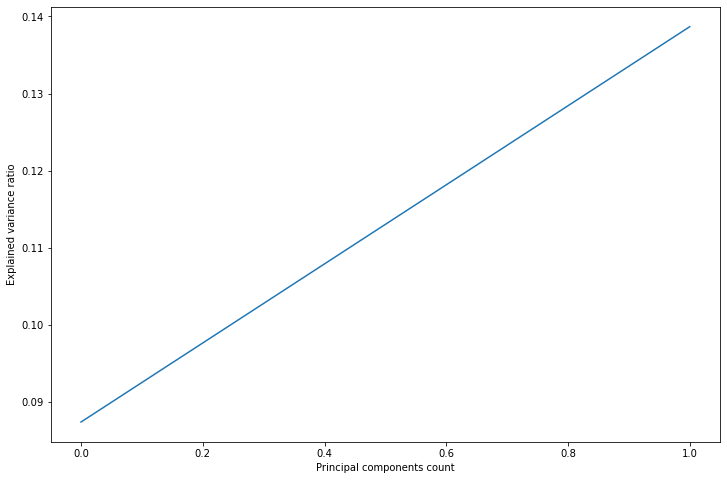

In [14]:
plt.figure(figsize=(12, 8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal components count')
plt.ylabel('Explained variance ratio')
plt.show()

### Dla 51 składowych głównych

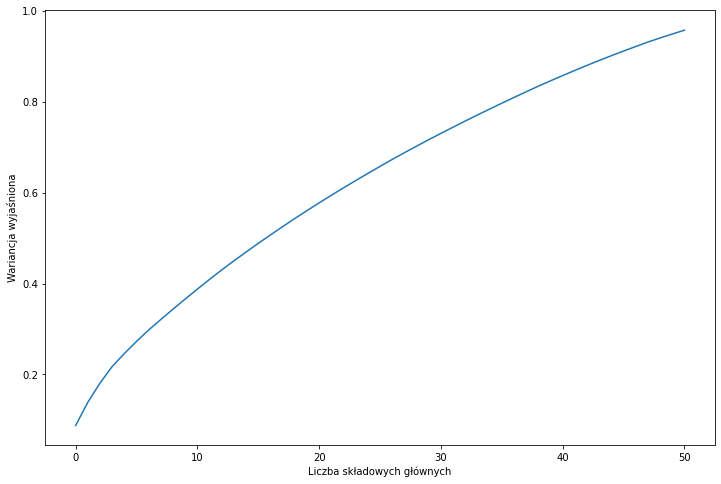

In [15]:
pca = PCA(n_components=51)
projected = pca.fit_transform(processed_images)

plt.figure(figsize=(12, 8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Liczba składowych głównych')
plt.ylabel('Wariancja wyjaśniona')
plt.show()